In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import datetime as dt

import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

from ray import tune
from ray.air import session
from ray.train import Checkpoint

from recsys4daos.utils.notebooks import download_plotly, download_matplotlib
import paths

pio.templates.default = 'seaborn'
sns.set_theme()

In [2]:
SPLITS_FREQ = 'W-THU'
SPLITS_NORMALIZE = True # Wether or not to move everything to 00:00
CUTOFF_DATE = dt.datetime.fromisoformat("2023-07-29")
RAY_RESULTS_PATH = '~/ray_results3.11'
ORG_NAME = 'Decentraland'
LAST_FOLDS = 10 # Used for asserts
LAST_FOLD_DATE_STR: str = '2023-07-13'

OPTIM_METRIC = 'map@10'
OPTIM_MODE = 'max'

SAMPLES_PER_SPLIT: int = 100 # See 07_microsoft_tuning.ipynb

In [3]:
# Parameters
EXECUTION_ID = "2024-09-04T10:00"
MIN_BATCH_SIZE = 4
ORG_NAME = "Magic Square"
SPLITS_FREQ = "7d"
LAST_FOLDS = 10
SPLITS_NORMALIZE = True
LAST_FOLD_DATE_STR = "2023-07-17"


In [4]:
RAY_RESULTS_PATH = Path(RAY_RESULTS_PATH).expanduser()
assert RAY_RESULTS_PATH.is_dir()

## Get ray results

In [5]:
fname_glob = paths.lightgcn_ray_tune_fname(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, OPTIM_METRIC, fold='glob')
fname_glob

'Magic Square/LightGCN_7d_normalize_map@10_fold=[0-9]*'

In [6]:
last_experiments = sorted(RAY_RESULTS_PATH.glob(fname_glob))
print(f"Found {len(last_experiments)} folds")

class TrainLightGCN:
    def __init__(self):
        raise NotImplementedError

tuners = [ tune.Tuner.restore(str(l), TrainLightGCN) for l in last_experiments ]
result_grids = [ tuner.get_results() for tuner in tuners ]
assert len(result_grids) == LAST_FOLDS, f"Waiting for full experiment to run {len(result_grids)}/{LAST_FOLDS}"

for i, rg in enumerate(result_grids):
    print(f"Fold: {i}, {rg.num_terminated} finished, {rg.num_errors} errors")
    assert rg.num_terminated == SAMPLES_PER_SPLIT
    assert rg.num_errors == 0, "There should be no errors"

Found 10 folds


Fold: 0, 100 finished, 0 errors
Fold: 1, 100 finished, 0 errors
Fold: 2, 100 finished, 0 errors
Fold: 3, 100 finished, 0 errors
Fold: 4, 100 finished, 0 errors
Fold: 5, 100 finished, 0 errors
Fold: 6, 100 finished, 0 errors
Fold: 7, 100 finished, 0 errors
Fold: 8, 100 finished, 0 errors
Fold: 9, 100 finished, 0 errors


In [7]:
# Checking data from just one experiment
pd.concat(result_grids[0]._experiment_analysis.trial_dataframes.values())

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,node_ip,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,32,5,0.030550,0.019062,0.011488,0.307768,0.756757,0.756757,0.756757,0.756757,...,147.96.81.131,1.595370,1,5,34,2,0.0091,0.000761,60d,2023-05-15T00:00:00
1,32,10,0.014113,0.006042,0.008071,0.306160,0.752896,0.752896,0.752896,0.752896,...,147.96.81.131,3.007523,2,5,34,2,0.0091,0.000761,60d,2023-05-15T00:00:00
2,32,15,0.009986,0.003143,0.006843,0.322063,0.783784,0.783784,0.783784,0.783784,...,147.96.81.131,4.381518,3,5,34,2,0.0091,0.000761,60d,2023-05-15T00:00:00
3,32,20,0.008565,0.002186,0.006379,0.316739,0.768340,0.768340,0.768340,0.768340,...,147.96.81.131,5.952533,4,5,34,2,0.0091,0.000761,60d,2023-05-15T00:00:00
4,32,25,0.007757,0.001581,0.006176,0.312964,0.760618,0.760618,0.760618,0.760618,...,147.96.81.131,7.524239,5,5,34,2,0.0091,0.000761,60d,2023-05-15T00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,64,180,0.004070,0.000489,0.003581,0.306121,0.752896,0.752896,0.752896,0.752896,...,147.96.81.131,103.628978,36,6,76,1,0.0152,0.000698,21d,2023-05-15T00:00:00
36,64,185,0.004114,0.000504,0.003610,0.323871,0.772201,0.772201,0.772201,0.772201,...,147.96.81.131,105.917852,37,6,76,1,0.0152,0.000698,21d,2023-05-15T00:00:00
37,64,190,0.004049,0.000490,0.003559,0.312428,0.768340,0.768340,0.768340,0.768340,...,147.96.81.131,108.204684,38,6,76,1,0.0152,0.000698,21d,2023-05-15T00:00:00
38,64,195,0.004124,0.000526,0.003598,0.321216,0.779923,0.779923,0.779923,0.779923,...,147.96.81.131,110.379422,39,6,76,1,0.0152,0.000698,21d,2023-05-15T00:00:00


## Create dataframe with all results

In [8]:
# Read dataframe and drop some unneeded columns
# rdf = pd.concat([rg.get_dataframe(TARGET, 'max') for rg in result_grids ])
rdf = pd.concat([ pd.concat(rg._experiment_analysis.trial_dataframes.values()) for rg in result_grids ])

drop_cols = [
    'timestamp', 'node_ip', 'pid', 'hostname', 'time_since_restore', # 'checkpoint_dir_name', 'trial_id', # 'logdir'
    'model_recall', 'model_ndcg', 'model_precision', 'model_map', 
    'time_train', 'time_eval', 'time_total_s', 'time_this_iter_s',
    'training_iteration', 'iterations_since_restore',
    # 'recall@5', 'map@5', 'recall@10', 'map@10',
]
rdf = rdf.drop(columns=drop_cols)
rdf = rdf.drop(columns=['date']).rename(columns={'config/__trial_index__': 'config/fold', 'iteration':'config/iteration'})
rdf['config/fold'] = pd.to_datetime(rdf['config/fold'])
# rdf = rdf[rdf['done']]
print(rdf.columns)

for c in ['config/batch_size']: #, 'config/embedding_dim']:
    rdf[c] = 2**rdf[c]

# rdf[(rdf['config/fold'] >= 1) & (rdf['iteration'] > 10)].sort_values('precision@5').tail()
# Display some results
rdf.sort_values(OPTIM_METRIC).tail()

Index(['real_batch_size', 'config/iteration', 'loss', 'mf_loss', 'emb_loss',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_rec', 'time_total_train', 'time_total_test', 'done', 'trial_id',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_size',
       'config/fold'],
      dtype='object')


,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,1024,5,0.577489,0.561536,0.015953,0.873548,0.547277,0.385373,0.262748,0.196947,...,0.330919,False,1c62b808,1024,1,3,0.2239,0.000035,10YE,2023-07-17
0,16,5,0.610435,0.601557,0.008879,0.895420,0.555935,0.386740,0.256049,0.194896,...,0.344218,True,c7fb91fd,16,1,3,0.0079,0.002686,21d,2023-07-17
0,16,5,0.160473,0.159690,0.000783,0.906357,0.544999,0.391251,0.257553,0.195671,...,0.305284,True,3672f849,16,2,2,0.0012,0.000427,60d,2023-07-17
0,128,5,0.657955,0.605817,0.052138,0.930964,0.578492,0.407929,0.264046,0.197357,...,0.316899,True,0e404db3,128,2,4,0.0951,0.006403,60d,2023-07-17
0,128,5,0.514400,0.503091,0.011310,0.941217,0.583276,0.402871,0.265619,0.197038,...,0.325000,True,64fad5fb,128,1,4,0.0501,0.001438,60d,2023-07-17


### Define K_RECOMMENDATIONS

In [9]:
K_RECOMMENDATIONS = { int(c.split('@')[1]) for c in rdf.columns if '@' in c }
K_RECOMMENDATIONS

{1, 3, 5, 10, 15, 100}

## Assert that every experiment was completed

In [10]:
_config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

# _s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
# print(_s)

# Cuidado, no es aleatorio sin reemplazamiento, por lo que
# alguna config, por casualidad, puede estar repetida y es necesario
# usar trial_id
_config_cols.append('trial_id')

_s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
print(_s)
assert all(_s == SAMPLES_PER_SPLIT), "Insufficient number of samples" 

config/fold
2023-05-15    100
2023-05-22    100
2023-05-29    100
2023-06-05    100
2023-06-12    100
2023-06-19    100
2023-06-26    100
2023-07-03    100
2023-07-10    100
2023-07-17    100
dtype: int64


## Get total execution time

In [11]:
_config_cols = ['trial_id'] + [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

last_iteration_time = rdf.groupby(_config_cols)['time_total_train'].max()
print(last_iteration_time)
print("Mean exec time: ", dt.timedelta(seconds=last_iteration_time.mean()))
print("Total exec time:", dt.timedelta(seconds=last_iteration_time.sum()))

trial_id  config/batch_size  config/embedding_dim  config/conv_layers  config/learning_rate  config/l2     config/window_size  config/fold
0043729f  256                86                    3                   0.0002                1.667490e-04  30d                 2023-05-29      302.436384
007a5f4a  16                 3                     1                   0.0097                1.527777e-07  10YE                2023-05-29      354.187559
00e93b4e  512                60                    4                   0.6649                1.863946e-04  90d                 2023-07-10      372.313033
00fd2666  64                 9                     3                   0.0095                1.016667e-06  21d                 2023-07-10      417.310751
01130513  1024               1                     4                   0.0527                3.280119e-04  10YE                2023-07-03      303.095258
                                                                                           

In [12]:
# Number of iterations
rdf.groupby('trial_id')['config/iteration'].max().describe()

count    1000.000000
mean       54.445000
std        74.979256
min         5.000000
25%         5.000000
50%        15.000000
75%        65.000000
max       200.000000
Name: config/iteration, dtype: float64

## Get baseline data

In [13]:
bdf = paths.load_openpop(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
bdf = bdf[bdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
bdf.mean()

precision@1        0.535684
precision@3        0.483744
precision@5        0.431044
precision@10       0.370521
precision@15       0.328433
precision@100      0.066991
ndcg@1             0.535684
ndcg@3             0.558325
ndcg@5             0.568873
ndcg@10            0.621794
ndcg@15            0.672238
ndcg@100           0.747232
map@1              0.535684
map@3              0.542428
map@5              0.541298
map@10             0.561438
map@15             0.588230
map@100            0.636924
recall@1           0.177683
recall@3           0.347050
recall@5           0.444865
recall@10          0.649475
recall@15          0.803780
recall@100         1.000000
r-precision@1      0.284003
r-precision@3      0.494071
r-precision@5      0.590328
r-precision@10     0.678087
r-precision@15     0.738446
r-precision@100    0.771022
time_eval          1.908535
dtype: float64

In [14]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-15,0.760618,0.673102,0.544402,0.364865,0.253024,0.037954,0.760618,0.801015,0.822257,0.867315,...,0.967028,1.000000,1.0,0.409379,0.740299,0.842660,0.924507,0.933445,0.933445,0.187275
2023-05-22,0.384449,0.395248,0.390065,0.400000,0.403888,0.091404,0.384449,0.430780,0.453456,0.513717,...,0.486307,0.680727,1.0,0.233058,0.346432,0.430699,0.591339,0.704521,0.807491,0.359745
2023-05-29,0.663484,0.610581,0.599284,0.528401,0.422753,0.078162,0.663484,0.691477,0.724434,0.767998,...,0.784751,0.881077,1.0,0.255909,0.420624,0.520333,0.711331,0.770070,0.805022,0.681002
2023-06-05,0.461538,0.476744,0.473524,0.443470,0.407454,0.077299,0.461538,0.519599,0.542190,0.600242,...,0.618569,0.823529,1.0,0.240077,0.369050,0.502098,0.657049,0.740110,0.768742,0.614539
2023-06-12,0.365923,0.345515,0.325012,0.303939,0.277108,0.061315,0.365923,0.380373,0.393237,0.440937,...,0.462305,0.625590,1.0,0.258619,0.438177,0.538640,0.695650,0.762311,0.800159,1.320038
2023-06-19,0.204834,0.203827,0.194381,0.335257,0.364371,0.070205,0.204834,0.215350,0.221142,0.399090,...,0.533650,0.806996,1.0,0.216863,0.424963,0.558378,0.559247,0.670773,0.683865,2.411973
2023-06-26,0.385518,0.382948,0.385116,0.366309,0.362677,0.076611,0.385518,0.398537,0.410503,0.483073,...,0.532342,0.758679,1.0,0.186059,0.396966,0.548723,0.564100,0.641772,0.655257,2.193587
2023-07-03,0.887229,0.860173,0.742857,0.486255,0.382496,0.069115,0.887229,0.894841,0.889882,0.875543,...,0.826636,0.893322,1.0,0.237124,0.586151,0.639244,0.721740,0.758684,0.786692,3.759019
2023-07-10,0.278786,0.287344,0.242401,0.206924,0.212561,0.077692,0.278786,0.292838,0.281950,0.299843,...,0.306004,0.570791,1.0,0.146305,0.345611,0.420764,0.411503,0.441560,0.505781,7.129106


(0.0, 1.0)

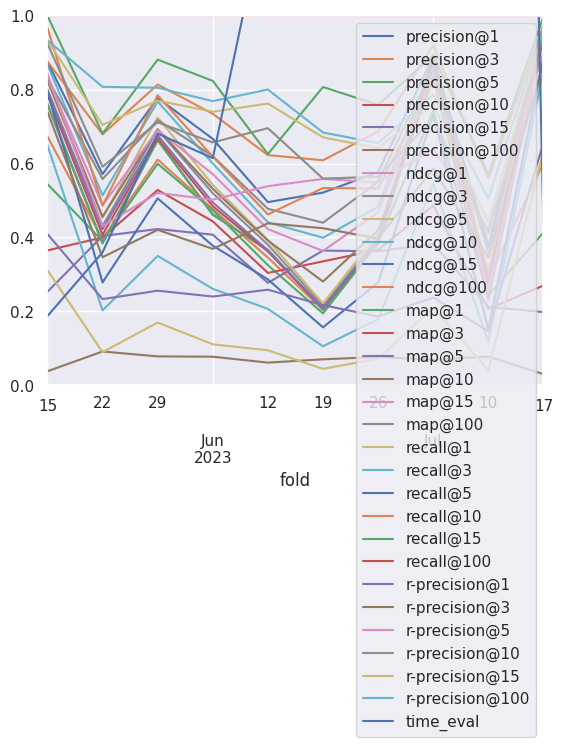

In [15]:
ax = bdf.plot()
ax.set_ylim(0, 1)

### Get perfect data

In [16]:
pdf = paths.load_perfect(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
pdf = pdf[pdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
pdf.mean()

precision@1        1.000000
precision@3        0.847521
precision@5        0.728658
precision@10       0.541165
precision@15       0.414921
precision@100      0.066991
ndcg@1             1.000000
ndcg@3             1.000000
ndcg@5             1.000000
ndcg@10            1.000000
ndcg@15            1.000000
ndcg@100           1.000000
map@1              1.000000
map@3              1.000000
map@5              1.000000
map@10             1.000000
map@15             1.000000
map@100            1.000000
recall@1           0.354812
recall@3           0.638903
recall@5           0.774970
recall@10          0.927547
recall@15          0.977276
recall@100         1.000000
r-precision@1      0.354812
r-precision@3      0.638903
r-precision@5      0.774970
r-precision@10     0.927547
r-precision@15     0.977276
r-precision@100    1.000000
time_eval          2.266993
dtype: float64

In [17]:
pdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-15,1.0,0.782497,0.607722,0.370656,0.253024,0.037954,1.0,1.0,1.0,1.0,...,0.992512,1.000000,1.0,0.468267,0.812136,0.921449,0.992512,1.000000,1.0,0.197850
2023-05-22,1.0,0.817855,0.731317,0.611015,0.523254,0.091404,1.0,1.0,1.0,1.0,...,0.839672,0.935367,1.0,0.352570,0.557710,0.667638,0.839672,0.935367,1.0,0.531404
2023-05-29,1.0,0.819809,0.735800,0.594153,0.470406,0.078162,1.0,1.0,1.0,1.0,...,0.896998,0.966749,1.0,0.360239,0.578927,0.708316,0.896998,0.966749,1.0,0.659303
2023-06-05,1.0,0.854800,0.784079,0.622361,0.485689,0.077299,1.0,1.0,1.0,1.0,...,0.908877,0.978702,1.0,0.316806,0.550148,0.705823,0.908877,0.978702,1.0,0.825589
2023-06-12,1.0,0.887676,0.744376,0.511818,0.382376,0.061315,1.0,1.0,1.0,1.0,...,0.944731,0.980528,1.0,0.321864,0.667537,0.828073,0.944731,0.980528,1.0,1.535238
2023-06-19,1.0,0.912890,0.853233,0.617311,0.460463,0.070205,1.0,1.0,1.0,1.0,...,0.940824,0.993919,1.0,0.259352,0.543766,0.754918,0.940824,0.993919,1.0,2.979295
2023-06-26,1.0,0.937647,0.843647,0.672042,0.499073,0.076611,1.0,1.0,1.0,1.0,...,0.935607,0.990562,1.0,0.233677,0.534086,0.695149,0.935607,0.990562,1.0,2.950225
2023-07-03,1.0,0.944084,0.804113,0.550952,0.418139,0.069115,1.0,1.0,1.0,1.0,...,0.929452,0.971749,1.0,0.260007,0.622987,0.811148,0.929452,0.971749,1.0,4.269313
2023-07-10,1.0,0.890474,0.736359,0.589095,0.458428,0.077692,1.0,1.0,1.0,1.0,...,0.905705,0.957663,1.0,0.311506,0.631742,0.723655,0.905705,0.957663,1.0,8.129737


(0.0, 1.0)

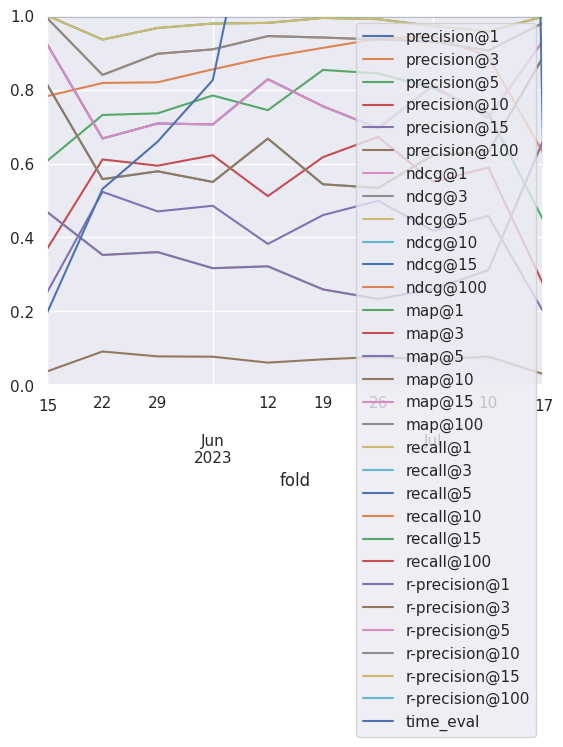

In [18]:
ax = pdf.plot()
ax.set_ylim(0, 1)

## Explore hparams

In [19]:
# Primero, obtenemos la mejor iteración, como si hubiesemos hecho early stopping
hdf = pd.concat(rg.get_dataframe(OPTIM_METRIC, OPTIM_MODE) for rg in result_grids)
print(hdf.columns)
hdf

Index(['real_batch_size', 'iteration', 'loss', 'mf_loss', 'emb_loss',
       'model_recall', 'model_ndcg', 'model_precision', 'model_map',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_eval', 'time_train', 'time_rec', 'time_total_train',
       'time_total_test', 'done', 'training_iteration', 'trial_id', 'date',
       'timestamp', 'time_this_iter_s', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'iterations_since_restore',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_siz

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,logdir
0,32,55,0.007132,0.001037,0.006095,0.337379,0.803089,0.803089,0.803089,0.803089,...,18.768961,11,5,34,2,0.0091,0.000761,60d,2023-05-15T00:00:00,8a200920
1,1024,10,0.047739,0.047316,0.000423,0.324011,0.783784,0.783784,0.783784,0.783784,...,1.201149,2,10,777,3,0.0047,0.000016,21d,2023-05-15T00:00:00,bce69836
2,32,20,0.091405,0.091033,0.000373,0.323474,0.783784,0.783784,0.783784,0.783784,...,20.378092,4,5,37,2,0.0006,0.000012,90d,2023-05-15T00:00:00,d91f5f45
3,1024,85,0.226951,0.226937,0.000013,0.313891,0.768340,0.768340,0.768340,0.768340,...,9.945388,17,10,2,2,0.0020,0.000004,21d,2023-05-15T00:00:00,b3431112
4,512,80,16.068528,2.820811,13.247718,0.331103,0.806950,0.806950,0.806950,0.806950,...,12.183522,16,9,189,1,0.9608,0.000945,21d,2023-05-15T00:00:00,7da01990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,128,5,0.060721,0.060495,0.000227,0.438315,0.548872,0.548872,0.548872,0.785373,...,841.111894,1,7,3,4,0.0203,0.000005,21d,2023-07-17T00:00:00,a968dc2f
96,512,5,0.077429,0.031227,0.046202,0.421250,0.502392,0.502392,0.502392,0.725906,...,531.962154,1,9,118,4,0.0293,0.008203,21d,2023-07-17T00:00:00,98f325c9
97,64,5,0.409460,0.405220,0.004240,0.565156,0.753247,0.753247,0.753247,0.875598,...,2416.464858,1,6,1,2,0.0118,0.001670,30d,2023-07-17T00:00:00,92def9d4
98,1024,10,0.098382,0.031640,0.066742,0.481485,0.599453,0.599453,0.599453,0.765550,...,431.955215,2,10,152,3,0.0388,0.009718,21d,2023-07-17T00:00:00,d5415e3a


In [20]:
# Force categorization
hdf['config/fold'] = hdf['config/fold'].astype(str)

fig = px.scatter(hdf, x='map@10', y='ndcg@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [21]:
fig = px.scatter(hdf, x='iteration', y='loss', color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [22]:
fig = px.scatter(hdf, x='iteration', y=OPTIM_METRIC, color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [23]:
fig = px.scatter(hdf, x='loss', y='ndcg@10', color='config/fold', log_x=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [24]:
fig = px.scatter(hdf, x='real_batch_size', y='config/window_size', color='config/fold')
fig

In [25]:
fig = px.scatter(hdf, x=OPTIM_METRIC, y='precision@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_map_precision.pdf')
fig

In [26]:
def plotly_scatter_config(config, log=True):
    config_cols = [c for c in hdf.columns if c.startswith('config/') ]
    return px.scatter(hdf, x=config, y=OPTIM_METRIC, color='config/fold', marginal_x='rug', marginal_y='rug', log_x=log, hover_data=config_cols)

plotly_scatter_config('config/embedding_dim')

In [27]:
plotly_scatter_config('config/window_size', log=False)

In [28]:
plotly_scatter_config('config/learning_rate')

In [29]:
plotly_scatter_config('config/l2')

In [30]:
plotly_scatter_config('config/batch_size', log=False)

In [31]:
plotly_scatter_config('config/conv_layers')

In [32]:
def clean_results(df: pd.DataFrame):
    hparams = [ c.removeprefix('config/') for c in df.columns if c.startswith('config/') and c not in ['config/iteration', 'config/fold'] ]
    return (
        df
        .rename(columns=lambda c: c.removeprefix('config/'),)
        .rename(columns={
            'time_total_train': 'time_train',
            'time_total_test': 'time_eval',
            'time_total_rec': 'time_rec',
        })
        .drop(columns=['real_batch_size'])
        .set_index(['fold', *hparams])
    ), hparams

clean_rdf, hparams = clean_results(rdf.copy())
clean_rdf

iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size              
2023-05-15 32         34            2           0.0091        0.000761 60d                  5   
                                                                       60d                 10   
                                                                       60d                 15   
                                                                       60d                 20   
                                                                       60d                 25   
...                                                                                       ...   
2023-07-17 512        118           4           0.0293        0.008203 21d                  5   
           64         1             2           0.0118        0.001670 30d                  5   
           1024       152           3           0.0388        0.009718 21d                  5   
                                                                       21d                 10   
           256        1             4           0.0873        0.006291 21d                  5   

                                                                                        loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2023-05-15 32         34            2           0.0091        0.000761 60d          0.030550   
                                                                       60d          0.014113   
                                                                       60d          0.009986   
                                                                       60d          0.008565   
                                                                       60d          0.007757   
...                                                                                      ...   
2023-07-17 512        118           4           0.0293        0.008203 21d          0.077429   
           64         1             2           0.0118        0.001670 30d          0.409460   
           1024       152           3           0.0388        0.009718 21d          0.106935   
                                                                       21d          0.098382   
           256        1             4           0.0873        0.006291 21d          0.472165   

                                                                                     mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2023-05-15 32         34            2           0.0091        0.000761 60d          0.019062   
                                                                       60d          0.006042   
                                                                       60d          0.003143   
                                                                       60d          0.002186   
                                                                       60d          0.001581   
...                                                                                      ...   
2023-07-17 512        118           4           0.0293        0.008203 21d          0.031227   
           64         1             2           0.0118        0.001670 30d          0.405220   
           1024       152           3           0.0388        0.009718 21d          0.034737   
                                                                       21d          0.031640   
           256        1             4           0.0873        0.006291 21d          0.460699   

                                                                                    emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2023-05-15 32         34            2           0.0091        0.000761 60d          0.011488   
                                    

In [33]:
px.scatter(clean_rdf.reset_index(), y='iteration', x='loss', color='fold', log_x=True)

In [34]:
px.scatter(clean_rdf.reset_index(), x='loss', y=OPTIM_METRIC, color='fold', log_x=True)

Letting it run more iterations gets a best loss. But letting it run more does not get a best ndcg or map, as loss and the test results have not a strong correlation.

In [35]:
px.scatter(clean_rdf.reset_index(), y='iteration', x=OPTIM_METRIC, color='fold')

## Choosing best hparams

In [36]:
best_all = clean_rdf.sort_values(OPTIM_METRIC).drop_duplicates('trial_id', keep='last')
paths.save_model_results(best_all, 'lightgcn-all', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best_all

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Magic Square/models/lightgcn-all_7d_normalize.parquet


iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2023-07-10 16         586           2           0.0752        3.140908e-07 21d                  5   
                      518           2           0.1708        5.016779e-04 90d                  5   
2023-07-03 512        364           2           0.0002        2.081125e-06 90d                  5   
2023-07-10 512        3             2           0.0001        1.585058e-03 30d                 15   
2023-07-03 64         2             2           0.0109        1.742654e-07 60d                  5   
...                                                                                           ...   
2023-07-17 1024       1             3           0.2239        3.524399e-05 10YE                 5   
           16         1             3           0.0079        2.685880e-03 21d                  5   
                      2             2           0.0012        4.265254e-04 60d                  5   
           128        2             4           0.0951        6.402517e-03 60d                  5   
                      1             4           0.0501        1.438108e-03 60d                  5   

                                                                                             loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2023-07-10 16         586           2           0.0752        3.140908e-07 21d           3.928138   
                      518           2           0.1708        5.016779e-04 90d          64.619217   
2023-07-03 512        364           2           0.0002        2.081125e-06 90d           0.061886   
2023-07-10 512        3             2           0.0001        1.585058e-03 30d           0.286028   
2023-07-03 64         2             2           0.0109        1.742654e-07 60d           0.128658   
...                                                                                           ...   
2023-07-17 1024       1             3           0.2239        3.524399e-05 10YE          0.577489   
           16         1             3           0.0079        2.685880e-03 21d           0.610435   
                      2             2           0.0012        4.265254e-04 60d           0.160473   
           128        2             4           0.0951        6.402517e-03 60d           0.657955   
                      1             4           0.0501        1.438108e-03 60d           0.514400   

                                                                                          mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2023-07-10 16         586           2           0.0752        3.140908e-07 21d           3.838599   
                      518           2           0.1708        5.016779e-04 90d          27.155957   
2023-07-03 512        364           2           0.0002        2.081125e-06 90d           0.061824   
2023-07-10 512        3             2           0.0001        1.585058e-03 30d           0.279811   
2023-07-03 64         2             2           0.0109        1.742654e-07 60d           0.128652   
...                                                                                           ...   
2023-07-17 1024       1             3           0.2239        3.524399e-05 10YE          0.561536   
           16         1             3           0.0079        2.685880e-03 21d           0.601557   
                      2             2           0.0012        4.265254e-04 60d           0.159690   
           128        2             4           0.0951        6.402517e-03 60d           0.605817   
                      1             4           0.0501        1.438108e-03 60d           0.503091   

                                                                                         emb_loss  \
fold       batch_size embedding_dim conv_laye

### Per fold

In [37]:
# We fix the total time in less than 250 so it has time to do the same number of iterations with the next fold
# best = rdf[rdf['time_total_train'] + rdf['time_total_test'] < 250].sort_values(OPTIM_METRIC).drop_duplicates('config/fold', keep='last').set_index('config/fold').sort_index()
idx = clean_rdf.index.names + ['iteration']
best = clean_rdf.sort_values(OPTIM_METRIC).reset_index().drop_duplicates('fold', keep='last').set_index(idx).sort_index()
paths.save_model_results(best, 'lightgcn-best-val', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Magic Square/models/lightgcn-best-val_7d_normalize.parquet


,,,,,,,,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_train,time_eval,done,trial_id
fold,batch_size,embedding_dim,conv_layers,learning_rate,l2,window_size,iteration,,,,,,,,,,,,,,,,,,,,,
2023-05-15,32,4,3,0.3803,3.350207e-04,21d,20,0.768351,0.691978,0.076372,0.814672,0.698842,0.561390,0.365637,0.253024,0.037954,0.814672,...,0.737807,0.846062,0.923940,0.932155,0.932155,0.017003,19.578157,1.486078,False,f3f3e2ea
2023-05-22,1024,223,1,0.2971,2.143329e-06,90d,55,0.882861,0.821591,0.061269,0.634989,0.554356,0.517063,0.480130,0.447228,0.091404,0.634989,...,0.369946,0.447266,0.608403,0.714726,0.791119,0.011043,12.413468,4.656847,False,99dbb3fe
2023-05-29,16,1,1,0.0078,1.916678e-07,10YE,15,0.363512,0.363507,0.000004,0.595465,0.552904,0.529117,0.468616,0.378520,0.078162,0.595465,...,0.417265,0.527334,0.705903,0.760890,0.796667,0.193135,349.936600,1.929137,True,25af4a00
2023-06-05,256,1,2,0.4403,5.317596e-05,10YE,25,0.419039,0.388829,0.030210,0.669052,0.611509,0.583184,0.510018,0.432499,0.077299,0.669052,...,0.364029,0.494619,0.684114,0.751374,0.776014,0.212092,150.039794,2.798786,False,698ea537
2023-06-12,32,135,1,0.0086,7.561545e-04,60d,5,0.031957,0.015347,0.016610,0.495966,0.492644,0.475368,0.406597,0.341149,0.061315,0.495966,...,0.435744,0.551392,0.672627,0.715455,0.740433,1.470473,1168.433456,0.894747,True,a107b56c
2023-06-19,1024,271,4,0.0014,3.586746e-03,60d,5,0.088695,0.077762,0.010933,0.579456,0.525277,0.488036,0.425952,0.377664,0.070205,0.579456,...,0.477309,0.615369,0.796007,0.854057,0.863372,0.785202,149.342684,1.325566,False,7f27ff4e
2023-06-26,128,2,1,0.2073,1.055459e-04,10YE,5,0.915506,0.912625,0.002880,0.608448,0.591686,0.581026,0.494435,0.428003,0.076611,0.608448,...,0.372315,0.500356,0.672183,0.721418,0.731706,0.998514,617.472271,1.201894,True,cd0d50d4
2023-07-03,128,1,3,0.0307,5.928300e-04,90d,5,0.465011,0.459188,0.005823,0.862338,0.747330,0.705281,0.471169,0.373896,0.069115,0.862338,...,0.529047,0.713527,0.794005,0.832023,0.860715,1.560537,1198.790145,2.081814,True,0be74d3e
2023-07-10,1024,3,2,0.0067,8.806824e-06,90d,10,0.062145,0.061768,0.000376,0.458895,0.441736,0.397044,0.299222,0.255576,0.077692,0.458895,...,0.502377,0.555384,0.553654,0.586882,0.625130,0.679336,36.515402,8.069584,False,79a2e92d


,precision@5,map@10
count,10.000000,10.000000
mean,0.524038,0.670359
std,0.091614,0.146994
min,0.397044,0.484744
25%,0.478535,0.588656
50%,0.523090,0.619934
75%,0.576117,0.768929
max,0.705281,0.935692


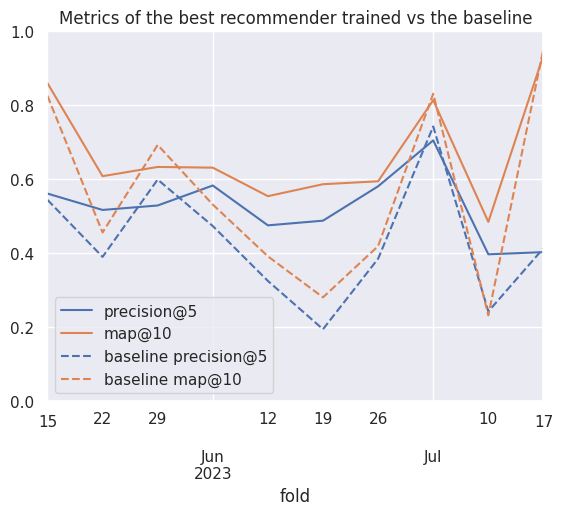

In [38]:
cols2plot = ['precision@5', 'map@10']

ax = best.reset_index().set_index('fold')[cols2plot].plot()
ax.set_ylim(0, 1)

bdf[cols2plot].rename(columns='baseline {}'.format).plot(ax=ax, style='--', color=[l.get_color() for l in ax.lines])

plt.title("Metrics of the best recommender trained vs the baseline")
best[cols2plot].describe()

In [39]:
best[['precision@5', 'ndcg@5', 'precision@10', 'ndcg@10', 'map@5', 'map@10']].mean()

precision@5     0.524038
ndcg@5          0.696092
precision@10    0.418739
ndcg@10         0.728746
map@5           0.656856
map@10          0.670359
dtype: float64

## Realisitc model (repeating hparams)

In [40]:
from pandas.api.types import is_float_dtype

config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]
config_cols2 = config_cols + ['config/iteration']

all_configs = rdf.copy()
display(all_configs)
all_configs['config/fold'] = (pd.to_datetime(all_configs['config/fold']) + pd.tseries.frequencies.to_offset(SPLITS_FREQ)) # .astype(str)

# Leonardo Torres de Quevedo, perdoname por lo que voy a hacer
float_cols = [c for c in config_cols if is_float_dtype(all_configs[c].dtype) ]
all_configs[float_cols] = all_configs[float_cols].astype(str)
all_configs = all_configs.set_index(config_cols)
all_configs_index = all_configs.index

# all_configs_index = pd.MultiIndex.from_frame(all_configs[config_cols].astype(str))[:-1]

# No podemos utilizar los indices "tal cual" pues la coma flotante
# no encaja entre un fold y otro. Así que lo convierto a string
# y luego de nuevo a coma flotante.
# La otra solución sería usar np.isclose, pero habría que programar
# varias lineas y hacer nuestra propia función de búsqueda por cada
# columna o algo así
# O también, en lugar de str, multiplicar por 10^7 (el min. es 10**-7),
# pasar a entero, y luego dividir
aux = rdf.copy()
aux[float_cols] = aux[float_cols].astype(str)
aux = aux.set_index(config_cols)
print("Index intersection:", aux.index.intersection(all_configs_index))
all_realistic = aux.loc[aux.index.intersection(all_configs_index)]
# all_realistic.index = all_realistic.index.set_levels(
#     [ pd.to_numeric(l) for l in realistic.index.levels ]
# )
all_realistic

,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,32,5,0.030550,0.019062,0.011488,0.756757,0.684685,0.550579,0.365251,0.253024,...,0.181801,False,8a200920,32,34,2,0.0091,0.000761,60d,2023-05-15
1,32,10,0.014113,0.006042,0.008071,0.752896,0.682111,0.549035,0.364865,0.253024,...,0.352089,False,8a200920,32,34,2,0.0091,0.000761,60d,2023-05-15
2,32,15,0.009986,0.003143,0.006843,0.783784,0.687259,0.548263,0.364865,0.253024,...,0.523051,False,8a200920,32,34,2,0.0091,0.000761,60d,2023-05-15
3,32,20,0.008565,0.002186,0.006379,0.768340,0.674389,0.549035,0.364479,0.253024,...,0.735072,False,8a200920,32,34,2,0.0091,0.000761,60d,2023-05-15
4,32,25,0.007757,0.001581,0.006176,0.760618,0.675676,0.548263,0.365251,0.253024,...,0.919680,False,8a200920,32,34,2,0.0091,0.000761,60d,2023-05-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,512,5,0.077429,0.031227,0.046202,0.725906,0.403964,0.319754,0.245728,0.194805,...,0.361523,True,98f325c9,512,118,4,0.0293,0.008203,21d,2023-07-17
0,64,5,0.409460,0.405220,0.004240,0.875598,0.520848,0.365687,0.247027,0.192937,...,0.336473,True,92def9d4,64,1,2,0.0118,0.001670,30d,2023-07-17
0,1024,5,0.106935,0.034737,0.072198,0.747779,0.433812,0.332604,0.245728,0.194532,...,0.322506,False,d5415e3a,1024,152,3,0.0388,0.009718,21d,2023-07-17
1,1024,10,0.098382,0.031640,0.066742,0.765550,0.436546,0.332741,0.245044,0.194532,...,0.642035,True,d5415e3a,1024,152,3,0.0388,0.009718,21d,2023-07-17


Index intersection: MultiIndex([( 512,  26, 2,                '0.6694', ...),
            ( 512, 332, 3,                '0.4863', ...),
            (  32,  97, 4, '0.0021000000000000003', ...),
            (  32, 217, 2,   '0.47850000000000004', ...),
            ( 512,   3, 2,                '0.0001', ...),
            ( 128,  32, 4,  '0.015000000000000001', ...),
            ( 256,   7, 4,                '0.1593', ...),
            (  32,  34, 2,                '0.0091', ...),
            (  32,  74, 2,                '0.1736', ...),
            ( 128,  96, 2,                '0.0784', ...),
            ...
            (  32, 217, 2,   '0.47850000000000004', ...),
            (  32,  34, 2,                '0.0091', ...),
            ( 128,  32, 4,  '0.015000000000000001', ...),
            (  64,  27, 2,                '0.2056', ...),
            ( 512,  26, 2,                '0.6694', ...),
            ( 512, 364, 2,                '0.0002', ...),
            ( 256,  86, 3,          

real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                    
512               26                   2                  0.6694                1.4272116622201335e-06 30d                2023-05-22               512   
                                                                                                                          2023-05-22               512   
                                                                                                                          2023-05-22               512   
                                                                                                                          2023-05-22               512   
                                                                                                                          2023-05-22               512   
...                                                                                                                                                ...   
256               86                   3                  0.0002                0.00016674901474097163 30d                2023-07-17               256   
1024              1                    1                  0.0029000000000000002 0.0006990705221345083  21d                2023-07-17              1024   
                                                                                                                          2023-07-17              1024   
32                74                   2                  0.1736                8.637993900055015e-07  10YE               2023-07-17                32   
128               219                  4                  0.095                 0.0002612310958370494  60d                2023-07-17               128   

                                                                                                                                       config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                     
512               26                   2                  0.6694                1.4272116622201335e-06 30d                2023-05-22                  5   
                                                                                                                          2023-05-22                 10   
                                                                                                                          2023-05-22                 15   
                                                                                                                          2023-05-22                 20   
                                                                                                                          2023-05-22                 25   
...                                                                                                                                                 ...   
256               86                   3                  0.0002                0.00016674901474097163 30d                2023-07-17                  5   
1024              1                    1                  0.0029000000000000002 0.0006990705221345083  21d                2023-07-17                  5   
                                                                                                                          2023-07-17                 10   
32                74                   2                  0.1736                8.637993900055015e-07  10YE               2023-07-17                  5   
128               219                  4                  0.095                 0.0002612310958370494  60d                2023-07-17                  5   

                                                                                                                    

In [41]:
def bestByFold(df):
    idx = df[OPTIM_METRIC].idxmax()
    return df.loc[idx]

best_configs = (
    all_configs.loc[all_configs.index.intersection(all_realistic.index)]
    .reset_index()
    .groupby("config/fold")
    .apply(bestByFold)
    .set_index(config_cols)
    # .rename(columns="best_{}".format)
)
best_configs

/tmp/ipykernel_1341473/543710717.py:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                    
32                74                   2                  0.1736                8.637993900055015e-07  10YE               2023-05-22                32   
1024              223                  1                  0.29710000000000003   2.143329211106706e-06  90d                2023-05-29              1024   
16                1                    1                  0.0078000000000000005 1.9166784088922103e-07 10YE               2023-06-05                16   
128               2                    3                  0.0049                0.0006887400114564803  60d                2023-06-12               128   
32                135                  1                  0.0086                0.0007561544592823426  60d                2023-06-19                32   
128               90                   4                  0.0005                0.0002808846157928507  60d                2023-06-26               128   
                  2                    1                  0.2073                0.0001055459444934651  10YE               2023-07-03               128   
                  1                    3                  0.0307                0.000592829977092084   90d                2023-07-10               128   
                  32                   4                  0.015000000000000001  1.242023640083893e-06  10YE               2023-07-17               128   

                                                                                                                                       config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold                     
32                74                   2                  0.1736                8.637993900055015e-07  10YE               2023-05-22                  5   
1024              223                  1                  0.29710000000000003   2.143329211106706e-06  90d                2023-05-29                 55   
16                1                    1                  0.0078000000000000005 1.9166784088922103e-07 10YE               2023-06-05                 15   
128               2                    3                  0.0049                0.0006887400114564803  60d                2023-06-12                 15   
32                135                  1                  0.0086                0.0007561544592823426  60d                2023-06-19                  5   
128               90                   4                  0.0005                0.0002808846157928507  60d                2023-06-26                  5   
                  2                    1                  0.2073                0.0001055459444934651  10YE               2023-07-03                  5   
                  1                    3                  0.0307                0.000592829977092084   90d                2023-07-10                  5   
                  32                   4                  0.015000000000000001  1.242023640083893e-06  10YE               2023-07-17                 10   

                                                                                                                                           loss  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate  config/l2              config/window_size config/fold             
32                74                   2                  0.1736                8.637993900055015e-07  10YE               2023-05-22   0.187211   
1024              223                  1                  0.29710000000000003   2.143329211106706e-06  90d                2023-05-29   0.882861   
16                1                    1                  0.0078000000000000005 1.9166784088922103e-07 10YE               2023-06-05   0.363512   

In [42]:
best_realistic = all_realistic.join(best_configs.rename(columns="best_{}".format), how='right')

# Display the configs, to see that nothing is missing
display(best_realistic.groupby(best_realistic.index).size())

# First, do the "early stopping" (keep only the ones that are the same iterations or less)
best_realistic = best_realistic[best_realistic['config/iteration'] <= best_realistic['best_config/iteration']]
# Now, lets keep just the one with the best iteration
best_realistic = (
    best_realistic.sort_values('config/iteration')
    .groupby('config/fold')
    .tail(1)
    .sort_index()
    .reset_index()
    .set_index('config/fold')
    .sort_index()
)
best_realistic

(16, 1, 1, 0.0078000000000000005, 1.9166784088922103e-07, 10YE, 2023-06-05 00:00:00)     1
(32, 74, 2, 0.1736, 8.637993900055015e-07, 10YE, 2023-05-22 00:00:00)                   15
(32, 135, 1, 0.0086, 0.0007561544592823426, 60d, 2023-06-19 00:00:00)                    1
(128, 1, 3, 0.0307, 0.000592829977092084, 90d, 2023-07-10 00:00:00)                      4
(128, 2, 1, 0.2073, 0.0001055459444934651, 10YE, 2023-07-03 00:00:00)                    1
(128, 2, 3, 0.0049, 0.0006887400114564803, 60d, 2023-06-12 00:00:00)                     2
(128, 32, 4, 0.015000000000000001, 1.242023640083893e-06, 10YE, 2023-07-17 00:00:00)     1
(128, 90, 4, 0.0005, 0.0002808846157928507, 60d, 2023-06-26 00:00:00)                    1
(1024, 223, 1, 0.29710000000000003, 2.143329211106706e-06, 90d, 2023-05-29 00:00:00)    40
dtype: int64

,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,real_batch_size,config/iteration,loss,mf_loss,...,best_r-precision@3,best_r-precision@5,best_r-precision@10,best_r-precision@15,best_r-precision@100,best_time_rec,best_time_total_train,best_time_total_test,best_done,best_trial_id
config/fold,,,,,,,,,,,,,,,,,,,,,
2023-05-22,32,74,2,0.1736,8.637993900055015e-07,10YE,32,5,1.106959,1.100740,...,0.729546,0.841874,0.919257,0.927877,0.927877,0.028799,1.821296,0.187426,False,c3d7f4b2
2023-05-29,1024,223,1,0.29710000000000003,2.143329211106706e-06,90d,1024,55,0.721744,0.576629,...,0.369946,0.447266,0.608403,0.714726,0.791119,0.011043,12.413468,4.656847,False,99dbb3fe
2023-06-05,16,1,1,0.0078000000000000005,1.9166784088922103e-07,10YE,16,5,0.494123,0.494118,...,0.417265,0.527334,0.705903,0.760890,0.796667,0.193135,349.936600,1.929137,True,25af4a00
2023-06-12,128,2,3,0.0049,0.0006887400114564803,60d,128,10,0.113019,0.110145,...,0.408657,0.539194,0.727801,0.795895,0.821762,0.177365,315.686429,1.611185,True,6461537c
2023-06-19,32,135,1,0.0086,0.0007561544592823426,60d,32,5,0.036034,0.016260,...,0.435744,0.551392,0.672627,0.715455,0.740433,1.470473,1168.433456,0.894747,True,a107b56c
2023-06-26,128,90,4,0.0005,0.0002808846157928507,60d,128,5,0.070071,0.066169,...,0.475818,0.609813,0.794868,0.869393,0.878659,1.244053,615.062518,1.312028,True,2dc43dbd
2023-07-03,128,2,1,0.2073,0.0001055459444934651,10YE,128,5,1.042767,1.041168,...,0.372315,0.500356,0.672183,0.721418,0.731706,0.998514,617.472271,1.201894,True,cd0d50d4
2023-07-10,128,1,3,0.0307,0.000592829977092084,90d,128,5,0.448031,0.443668,...,0.529047,0.713527,0.794005,0.832023,0.860715,1.560537,1198.790145,2.081814,True,0be74d3e
2023-07-17,128,32,4,0.015000000000000001,1.242023640083893e-06,10YE,128,5,0.008651,0.008301,...,0.426992,0.467954,0.509319,0.564645,0.604726,0.783396,276.728740,7.791416,False,bc1a93af


In [43]:
paths.save_model_results(
    clean_results(best_realistic.reset_index().copy())[0],
    'lightgcn-best-test',
    ORG_NAME,
    SPLITS_FREQ,
    SPLITS_NORMALIZE,
    K_RECOMMENDATIONS,
)

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Magic Square/models/lightgcn-best-test_7d_normalize.parquet


,precision@5,map@10
count,9.000000,9.000000
mean,0.392475,0.493403
std,0.094418,0.150968
min,0.252930,0.325293
25%,0.334632,0.403735
50%,0.374751,0.456825
75%,0.432220,0.548737
max,0.575492,0.820356


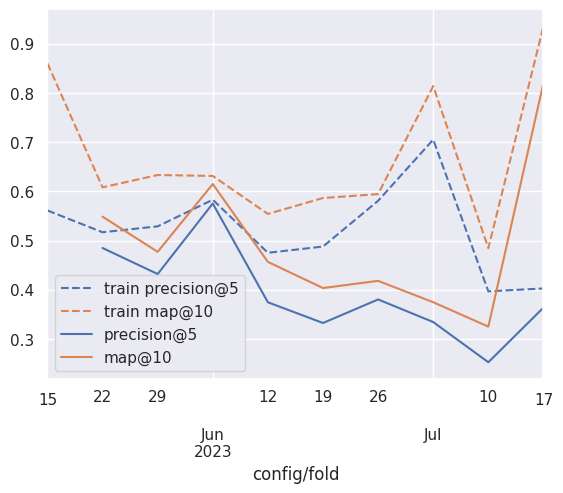

In [44]:
_toplot = best_realistic.copy().sort_index()
_toplot.index = pd.to_datetime(_toplot.index)

ax = best.reset_index().set_index('fold')[cols2plot].rename(columns='train {}'.format).plot(style='--', color=[l.get_color() for l in ax.lines])
# plt.xticks(range(10))
# bdf[cols2plot].rename(columns='baseline {}'.format).reset_index(drop=True).plot(ax=ax, style=':', color=[l.get_color() for l in ax.lines])

_toplot[cols2plot].plot(ax=ax)
# ax.set_ylim(0, 1)

_toplot[cols2plot].describe()

In [45]:
best_realistic.index.min()

Timestamp('2023-05-22 00:00:00')

In [46]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-15,0.760618,0.673102,0.544402,0.364865,0.253024,0.037954,0.760618,0.801015,0.822257,0.867315,...,0.967028,1.000000,1.0,0.409379,0.740299,0.842660,0.924507,0.933445,0.933445,0.187275
2023-05-22,0.384449,0.395248,0.390065,0.400000,0.403888,0.091404,0.384449,0.430780,0.453456,0.513717,...,0.486307,0.680727,1.0,0.233058,0.346432,0.430699,0.591339,0.704521,0.807491,0.359745
2023-05-29,0.663484,0.610581,0.599284,0.528401,0.422753,0.078162,0.663484,0.691477,0.724434,0.767998,...,0.784751,0.881077,1.0,0.255909,0.420624,0.520333,0.711331,0.770070,0.805022,0.681002
2023-06-05,0.461538,0.476744,0.473524,0.443470,0.407454,0.077299,0.461538,0.519599,0.542190,0.600242,...,0.618569,0.823529,1.0,0.240077,0.369050,0.502098,0.657049,0.740110,0.768742,0.614539
2023-06-12,0.365923,0.345515,0.325012,0.303939,0.277108,0.061315,0.365923,0.380373,0.393237,0.440937,...,0.462305,0.625590,1.0,0.258619,0.438177,0.538640,0.695650,0.762311,0.800159,1.320038
2023-06-19,0.204834,0.203827,0.194381,0.335257,0.364371,0.070205,0.204834,0.215350,0.221142,0.399090,...,0.533650,0.806996,1.0,0.216863,0.424963,0.558378,0.559247,0.670773,0.683865,2.411973
2023-06-26,0.385518,0.382948,0.385116,0.366309,0.362677,0.076611,0.385518,0.398537,0.410503,0.483073,...,0.532342,0.758679,1.0,0.186059,0.396966,0.548723,0.564100,0.641772,0.655257,2.193587
2023-07-03,0.887229,0.860173,0.742857,0.486255,0.382496,0.069115,0.887229,0.894841,0.889882,0.875543,...,0.826636,0.893322,1.0,0.237124,0.586151,0.639244,0.721740,0.758684,0.786692,3.759019
2023-07-10,0.278786,0.287344,0.242401,0.206924,0.212561,0.077692,0.278786,0.292838,0.281950,0.299843,...,0.306004,0.570791,1.0,0.146305,0.345611,0.420764,0.411503,0.441560,0.505781,7.129106


In [47]:
_PERFECT_NAME = 'Ground Truth'
_LEAK_NAME = 'Leaky GNN'
CAT_ORDER = [_PERFECT_NAME, _LEAK_NAME, 'GNN', 'OpenPop']

def _get_toplot_table(metrics2plot=cols2plot, oracle=True, perfect=None, common_only=False):
    if perfect is None:
        perfect = metrics2plot
    
    # _toplot = best_realistic.copy()
    # _toplot.index = pd.to_numeric(_toplot.index)
    # _toplot['fold'] = _toplot.index

    _first_real_fold_idx = best_realistic.index.min()
    
    _toplot_real = best_realistic[metrics2plot].copy()
    _toplot_real['fold'] = pd.to_datetime(_toplot_real.index) # .astype(int)
    _toplot_real['rec'] = 'GNN'

    _toplot_base = bdf[metrics2plot].copy()
    # fold2str = _toplot_base.index.strftime('%G-W%V')
    # _toplot_base['fold'] = range(len(_toplot_base))
    _toplot_base['fold'] = pd.to_datetime(_toplot_base.index)
    _toplot_base['rec'] = 'OpenPop'

    # _colsbest = map("best_{}".format, _cols)
    if oracle:
        _toplot_best = best.reset_index().set_index('fold')[metrics2plot].copy() # [_colsbest].rename(columns=lambda x: x.split("_", 1)[-1])
        _toplot_best['fold'] = _toplot_best.index
        _toplot_best['rec'] = _LEAK_NAME
    else:
        _toplot_best = None
        _toplot_base = _toplot_base[_toplot_base['fold'] >= _first_real_fold_idx]
        _toplot_real = _toplot_real[_toplot_real['fold'] >= _first_real_fold_idx]

    if perfect:
        _toplot_perfect = pdf[perfect].copy()
        _toplot_perfect['fold'] = pd.to_datetime(_toplot_perfect.index)
        _toplot_perfect['rec'] = _PERFECT_NAME
        # Make same len as baseline
        # _toplot_perfect = _toplot_perfect.iloc[-len(_toplot_base):]
        _toplot_perfect = _toplot_perfect.loc[_toplot_base.index]
        assert _toplot_perfect.index.equals(_toplot_base.index)
    else:
        _toplot_perfect = None
        
    _toplot = (
        pd.concat((
            _toplot_real, 
            _toplot_best,
            _toplot_base,
            _toplot_perfect,
        ), ignore_index=True)
        .melt(id_vars=['fold', 'rec'], value_vars=metrics2plot, var_name='metric')
    )

    assert pd.api.types.is_datetime64_any_dtype(_toplot['fold'].dtype), "Fold column should be datetime"
    assert not (_toplot['fold'].isna()).any()
    
    _toplot['rec'] = pd.Categorical(_toplot['rec'], CAT_ORDER)
    _toplot['fold_week'] = _toplot['fold'].dt.strftime('%G-W%V') # fold2str[_toplot['fold']]

    return _toplot.sort_values('fold')

_tablecols = ['precision@5', 'precision@10', 'recall@5', 'recall@10', 'map@5', 'map@10', 'ndcg@5', 'ndcg@10']
_table = _get_toplot_table(_tablecols)
# Skip the first fold so everyone has 9 folds and metrics are consistent
_table = _table[_table['fold'] >= best_realistic.index.min()]
print(_table.groupby(['rec', 'metric'])['value'].mean().unstack(level=-1)[_tablecols].rename(
    index={
        'Perfect': 'Ground Truth',
        'realistic': 'GNN'
    }
).style.format(precision=2).to_latex())
_table.groupby(['rec', 'metric']).describe()

\begin{tabular}{lrrrrrrrr}
metric & precision@5 & precision@10 & recall@5 & recall@10 & map@5 & map@10 & ndcg@5 & ndcg@10 \\
rec &  &  &  &  &  &  &  &  \\
Ground Truth & 0.74 & 0.56 & 0.76 & 0.92 & 1.00 & 1.00 & 1.00 & 1.00 \\
Leaky GNN & 0.52 & 0.42 & 0.52 & 0.71 & 0.64 & 0.65 & 0.68 & 0.71 \\
GNN & 0.39 & 0.35 & 0.39 & 0.57 & 0.47 & 0.49 & 0.52 & 0.56 \\
OpenPop & 0.42 & 0.37 & 0.41 & 0.61 & 0.51 & 0.53 & 0.54 & 0.59 \\
\end{tabular}



/tmp/ipykernel_1341473/3868849439.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_1341473/3868849439.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



fold                                            \
                          count                 mean                  min   
rec          metric                                                         
Ground Truth map@10           9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             map@5            9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             ndcg@10          9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             ndcg@5           9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             precision@10     9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             precision@5      9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             recall@10        9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             recall@5         9  2023-06-19 00:00:00  2023-05-22 00:00:00   
Leaky GNN    map@10           9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             map@5            9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             ndcg@10          9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             ndcg@5           9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             precision@10     9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             precision@5      9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             recall@10        9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             recall@5         9  2023-06-19 00:00:00  2023-05-22 00:00:00   
GNN          map@10           9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             map@5            9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             ndcg@10          9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             ndcg@5           9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             precision@10     9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             precision@5      9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             recall@10        9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             recall@5         9  2023-06-19 00:00:00  2023-05-22 00:00:00   
OpenPop      map@10           9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             map@5            9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             ndcg@10          9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             ndcg@5           9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             precision@10     9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             precision@5      9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             recall@10        9  2023-06-19 00:00:00  2023-05-22 00:00:00   
             recall@5         9  2023-06-19 00:00:00  2023-05-22 00:00:00   

                                                                     \
                                           25%                  50%   
rec          metric                                                   
Ground Truth map@10        2023-06-05 00:00:00  2023-06-19 00:00:00   
             map@5         2023-06-05 00:00:00  2023-06-19 00:00:00   
             ndcg@10       2023-06-05 00:00:00  2023-06-19 00:00:00   
             ndcg@5        2023-06-05 00:00:00  2023-06-19 00:00:00   
             precision@10  2023-06-05 00:00:00  2023-06-19 00:00:00   
             precision@5   2023-06-05 00:00:00  2023-06-19 00:00:00   
             recall@10     2023-06-05 00:00:00  2023-06-19 00:00:00   
             recall@5      2023-06-05 00:00:00  2023-06-19 00:00:00   
Leaky GNN    map@10        2023-06-05 00:00:00  2023-06-19 00:00:00   
             map@5         2023-06-05 00:00:00  2023-06-19 00:00:00   
             ndcg@10       2023-06-05 00:00:00  2023-06-19 00:00:00   
             ndcg@5        2023-06-05 00:00:00  2023-06-19 00:00:00   
             precision@10  2023-06-05 00:00:00  2023-06-19 00:00:00   
             precision@5   2023-06-05 00:00:00  2023-06-19 00:00:00   
             recall@10     2023-06-05 00:00:00  2023-06-19 00:00:00   
             recall@5      2023-06-05 00:00:00  2023-

/tmp/ipykernel_1341473/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1341473/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



count      mean       std       min       25%  \
rec          metric                                                       
Ground Truth map@10        10.0  1.000000  0.000000  1.000000  1.000000   
             precision@5   10.0  0.728658  0.121303  0.445933  0.732438   
Leaky GNN    map@10        10.0  0.670359  0.146994  0.484744  0.588656   
             precision@5   10.0  0.524038  0.091614  0.397044  0.478535   
GNN          map@10         9.0  0.493403  0.150968  0.325293  0.403735   
             precision@5    9.0  0.392475  0.094418  0.252930  0.334632   
OpenPop      map@10        10.0  0.561438  0.249895  0.231913  0.398487   
             precision@5   10.0  0.431044  0.165706  0.194381  0.340038   

                               50%       75%       max  
rec          metric                                     
Ground Truth map@10       1.000000  1.000000  1.000000  
             precision@5  0.740367  0.799104  0.853233  
Leaky GNN    map@10       0.619934  0.768929  0.935692  
             precision@5  0.523090  0.576117  0.705281  
GNN          map@10       0.456825  0.548737  0.820356  
             precision@5  0.374751  0.432220  0.575492  
OpenPop      map@10       0.493859  0.792583  0.953050  
             precision@5  0.401731  0.526682  0.742857

Cannot show ipywidgets in text

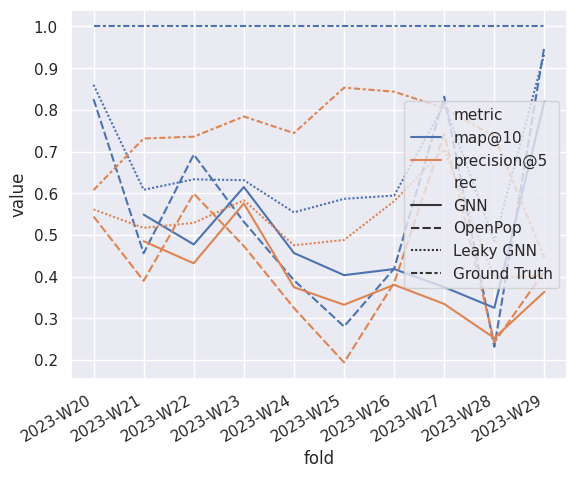

In [48]:
def plot_gnn_results(metrics2plot=cols2plot, oracle=False, perfect=None, common_only=False):
    _toplot = _get_toplot_table(metrics2plot, oracle, perfect)

    if common_only:
        _toplot = _toplot[_toplot['fold'] >= best_realistic.index.min()]

    ax = sns.lineplot(
        _toplot, x='fold_week', y='value', 
        hue='metric' if len(metrics2plot) > 1 else None, 
        style='rec',
        style_order=['GNN', 'OpenPop', _LEAK_NAME, _PERFECT_NAME],
    )
    ax.set_xlabel('fold')
    
    if len(metrics2plot) == 1:
        ax.set_ylabel(metrics2plot[0])
        ax.legend_.set_title(None)

    # ax.set_xticks(ax.get_xticks()[1:-1], _toplot_base.index.strftime('%G-W%V'), rotation=30, ha='right')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

    display(_toplot.groupby(['rec', 'metric'])['value'].describe())
    # print(_toplot.groupby(['rec', 'metric'])['value'].describe()[['mean', 'std', '50%', 'min', 'max']].to_html())

    return ax

ax = plot_gnn_results(oracle=True) # perfect=['precision@5'])
download_matplotlib(ax.figure, '09_gnn_results.pdf')

/tmp/ipykernel_1341473/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1341473/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,9.0,0.742095,0.120509,0.445933,0.735800,0.744376,0.804113,0.853233
GNN,precision@5,9.0,0.392475,0.094418,0.252930,0.334632,0.374751,0.432220,0.575492
OpenPop,precision@5,9.0,0.418449,0.170605,0.194381,0.325012,0.390065,0.473524,0.742857


Cannot show ipywidgets in text

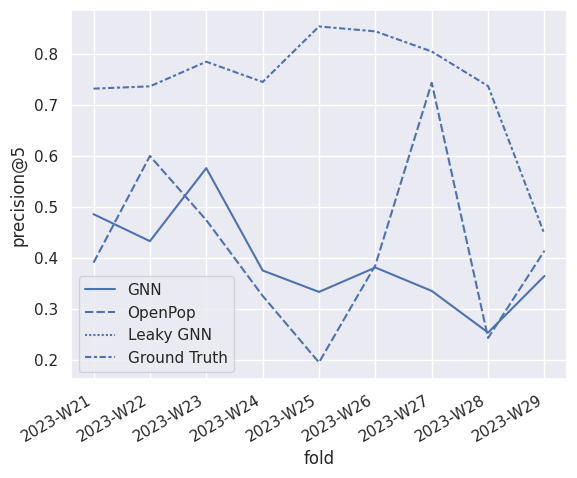

In [49]:
ax = plot_gnn_results(['precision@5'])
ax.figure.savefig('../figures/09_gnn_results_precision_5.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_precision_5.pdf')

/tmp/ipykernel_1341473/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1341473/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,9.0,0.742095,0.120509,0.445933,0.735800,0.744376,0.804113,0.853233
Leaky GNN,precision@5,9.0,0.519888,0.096169,0.397044,0.475368,0.517063,0.581026,0.705281
GNN,precision@5,9.0,0.392475,0.094418,0.252930,0.334632,0.374751,0.432220,0.575492
OpenPop,precision@5,9.0,0.418449,0.170605,0.194381,0.325012,0.390065,0.473524,0.742857


Cannot show ipywidgets in text

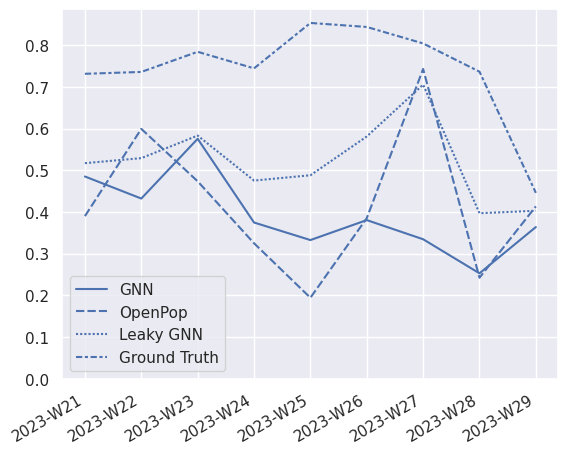

In [50]:
ax = plot_gnn_results(['precision@5'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_precision_5_leaky.pdf')

/tmp/ipykernel_1341473/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1341473/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,map@10,9.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
GNN,map@10,9.0,0.493403,0.150968,0.325293,0.403735,0.456825,0.548737,0.820356
OpenPop,map@10,9.0,0.532063,0.246061,0.231913,0.391565,0.456133,0.692904,0.953050


Cannot show ipywidgets in text

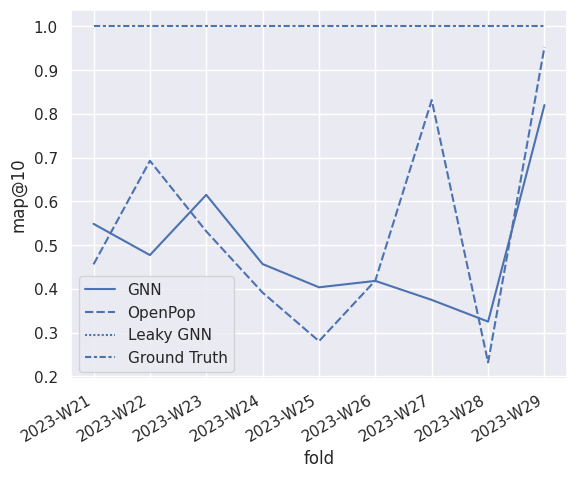

In [51]:
ax = plot_gnn_results(['map@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_map_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_map_10.pdf')

/tmp/ipykernel_1341473/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1341473/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,9.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
GNN,ndcg@10,9.0,0.558857,0.148899,0.376518,0.455391,0.507646,0.624244,0.863743
OpenPop,ndcg@10,9.0,0.594514,0.228524,0.299843,0.440937,0.513717,0.767998,0.970180


Cannot show ipywidgets in text

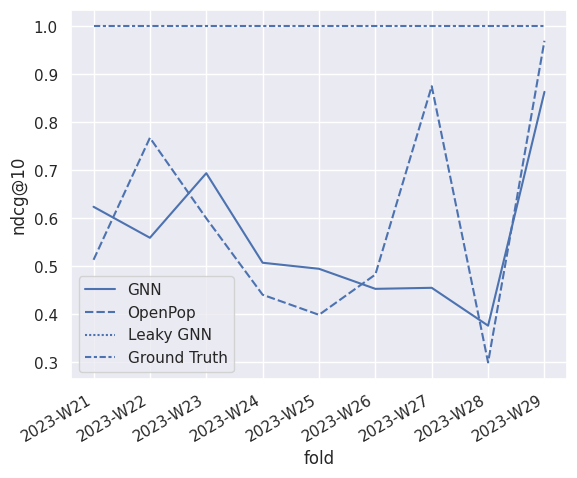

In [52]:
ax = plot_gnn_results(['ndcg@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_ndcg_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_ndcg_10.pdf')

/tmp/ipykernel_1341473/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_1341473/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,9.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Leaky GNN,ndcg@10,9.0,0.709765,0.122732,0.555938,0.638717,0.679348,0.714450,0.954269
GNN,ndcg@10,9.0,0.558857,0.148899,0.376518,0.455391,0.507646,0.624244,0.863743
OpenPop,ndcg@10,9.0,0.594514,0.228524,0.299843,0.440937,0.513717,0.767998,0.970180


Cannot show ipywidgets in text

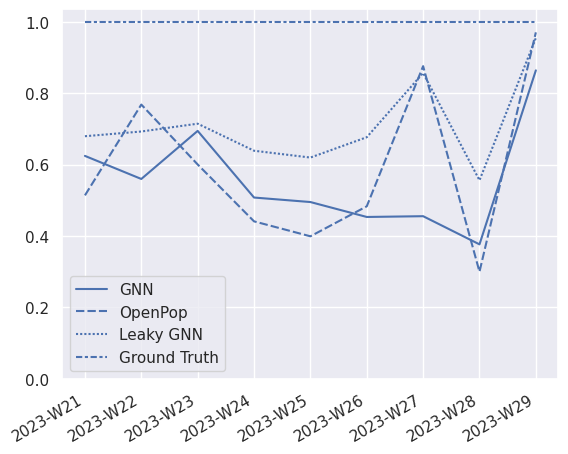

In [53]:
ax = plot_gnn_results(['ndcg@10'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_ndcg_10_leaky.pdf')